In [1]:
import os
from glob import glob
import pandas as pd
import numpy as np
import copy
import monai as mn
import bkh_pytorch_utils as bpu
import torch
import pytorch_lightning as pl
import timm
from tqdm.auto import tqdm
from pathlib import Path
import matplotlib.pyplot as plt

from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

In [2]:
def get_data_dict(all_path, base):
    data_dict = list()
    for i in range(len(all_path)):
        
        path = all_path['Path'][i]
        
        data_dict.append({
            'idx': i,
            'img': base+path,
            'Prob':  all_path['Prob'][i],
            'PP': all_path['PP'][i],
            'Path': path
        })

    return data_dict

def get_number_from_str(df_results):
    df_results['Label'] = pd.Series([eval(i)[0] for i in df_results['Labels']])
    df_results['Prob'] = pd.Series([eval(i)[0] for i in df_results['Probs']])
    df_results['Logit'] = pd.Series([eval(i)[0] for i in df_results['Logits']])
    return df_results

class ClassifierModule(bpu.BKhModule):
    def __init__(self, num_classes=2, collate_fn=None, val_collate_fn=None, train_sampler=None, val_sampler=None, train_ds=None, val_ds=None, dl_workers=-1, pin_memory=True, batch_size=2, val_batch_size=None, lr=1e-4, prefetch_factor=1, persistent_workers=False):
        super().__init__(collate_fn=collate_fn, val_collate_fn=val_collate_fn, train_sampler=train_sampler, val_sampler=val_sampler, train_ds=train_ds, val_ds=val_ds, dl_workers=dl_workers, batch_size=batch_size, val_batch_size=val_batch_size, pin_memory=pin_memory, prefetch_factor=prefetch_factor, persistent_workers=persistent_workers)
        self.model = timm.create_model("convnext_base.fb_in22k_ft_in1k", pretrained=False, in_chans=1, num_classes=num_classes)
    
    def forward(self, img):
        return self.model(img)


In [3]:
def show_images_with_CAM(image, CAM):  
    sm = mn.transforms.MedianSmooth(radius=4)
    sc = mn.transforms.ScaleIntensity(minv=0.0, maxv=1.0)
    image = sc(image)
    CAM = sm(CAM)
    CAM = sc(CAM)
    plt.imshow(np.squeeze(image), cmap='gray', alpha=1)
    plt.imshow(np.squeeze(CAM), cmap='inferno', alpha=0.2)
    plt.axis('off')
    
def flip_and_rotate(img):
    trans = mn.transforms.Compose([mn.transforms.ScaleIntensity(minv=0.0, maxv=1.0),
                                   mn.transforms.Rotate90(k=3, spatial_axes=(0,1), lazy=False),
                                   mn.transforms.Flip(spatial_axis=1, lazy=False)])
    
    return trans(img)

def get_CAM(im0, CAM_method, label, model):
    
    method_dict = {"GradCAM":GradCAM, 
                   "HiResCAM":HiResCAM, 
                   "ScoreCAM":ScoreCAM, 
                   "GradCAMPlusPlus":GradCAMPlusPlus, 
                   "AblationCAM":AblationCAM, 
                   "XGradCAM":XGradCAM, 
                   "EigenCAM":EigenCAM, 
                   "FullGrad":FullGrad}
    
    target_layers = [model.model.norm_pre]#stages[3].blocks[2].drop_path] 

    img_for_show = im0.numpy()
    img_for_show = np.squeeze(img_for_show)
    img_for_show = np.expand_dims(img_for_show, axis=0)

    input_tensor = im0

    # Construct the CAM object once, and then re-use it on many images:
    cam = method_dict[CAM_method](model=model, target_layers=target_layers, use_cuda=False)
    
    targets = [ClassifierOutputTarget(label)]

    # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    
    # In this example grayscale_cam has only one image in the batch:
    grayscale_cam = grayscale_cam[0, :]    
    grayscale_cam = np.expand_dims(grayscale_cam, axis=0)

    img_for_show0 = flip_and_rotate(img_for_show)
    grayscale_cam0 = flip_and_rotate(grayscale_cam)
    #print(grayscale_cam0.min(), grayscale_cam0.max())

    return show_images_with_CAM(img_for_show0, grayscale_cam0)

In [6]:
def visualize_CAM(pathology, base, ds):


    df_LUT_EQ = pd.read_csv(f'./results/results_{pathology}_1_{ds}.csv')
    df_LUT_noEQ = pd.read_csv(f'./results/results_{pathology}_3_{ds}.csv')
    df_noLUT_EQ = pd.read_csv(f'./results/results_{pathology}_2_{ds}.csv')
    df_noLUT_noEQ = pd.read_csv(f'./results/results_{pathology}_4_{ds}.csv')

    df_LUT_EQ = get_number_from_str(df_LUT_EQ)
    df_LUT_noEQ = get_number_from_str(df_LUT_noEQ)
    df_noLUT_EQ = get_number_from_str(df_noLUT_EQ)
    df_noLUT_noEQ = get_number_from_str(df_noLUT_noEQ)

    df_LUT_noEQ = df_LUT_noEQ[(df_LUT_noEQ['Label']==1)&(df_LUT_noEQ['Prob']>=0.9)]
    im_path0 = df_LUT_noEQ.sample(n=1).loc[:,'Path'].values[0]

    sample_LUT_EQ = df_LUT_EQ[df_LUT_EQ['Path']==im_path0]
    sample_LUT_noEQ = df_LUT_noEQ[df_LUT_noEQ['Path']==im_path0]
    sample_noLUT_EQ = df_noLUT_EQ[df_noLUT_EQ['Path']==im_path0]
    sample_noLUT_noEQ = df_noLUT_noEQ[df_noLUT_noEQ['Path']==im_path0]

    sample_LUT_EQ['PP'] = 'LUT_EQ'
    sample_LUT_noEQ['PP'] = 'LUT_noEQ'
    sample_noLUT_EQ['PP'] = 'noLUT_EQ'
    sample_noLUT_noEQ['PP'] = 'noLUT_noEQ'
    

    data_4_CAM = pd.concat([sample_LUT_EQ,sample_LUT_noEQ,sample_noLUT_EQ,sample_noLUT_noEQ], axis=0).reset_index()
    data_dict = get_data_dict(data_4_CAM, base)
    #print(data_dict)

    IMG_SIZE = 256
    BATCH_SIZE = 1
    NUM_DL_WORKERS = 4


    transforms=mn.transforms.Compose([
        mn.transforms.LoadImageD(keys="img", ensure_channel_first=False),
        bpu.EnsureGrayscaleD(keys="img"),
        mn.transforms.ResizeD(keys='img', size_mode="longest", mode="bilinear", spatial_size=IMG_SIZE, align_corners=False),
        mn.transforms.ScaleIntensityRangePercentilesD(keys="img", lower=0, upper=100, b_min=-1, b_max=1, clip=True),
        mn.transforms.SpatialPadD(keys='img', spatial_size=(IMG_SIZE, IMG_SIZE), mode="constant", constant_values=-1),
        mn.transforms.SelectItemsD(keys=["img","idx","Prob",'PP','Path']),
        mn.transforms.ToTensorD(keys=["img"], dtype=torch.float, track_meta=False)
    ])

    dataset = mn.data.Dataset(data=data_dict, transform=transforms)  

    model=ClassifierModule(
        val_ds=dataset,
        num_classes=1,
        batch_size=BATCH_SIZE,
        dl_workers = NUM_DL_WORKERS,
        pin_memory=False,
        prefetch_factor=1,
        persistent_workers=False
    )
    model.eval()
    model.cpu()
    #print(model)

    dl = model.val_dataloader()

    plt.figure(figsize=(10,10))
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    plt.suptitle(f'{pathology}thorax', y=0.92)
    for i, batch in enumerate(dl):
        idx = batch['idx'].item()
        img, pp, prob, path = batch['img'], batch['PP'], batch['Prob'], batch['Path']
        img = img.cpu()
        weight = glob(f'./weights/{pathology}_{pp[0]}*/*.ckpt')[0]
        print(path[0])
        model.load_ckpt(weight, ema=True)

        plt.subplot(2, 2, i+1)
        plt.title( f'{pp[0]}, Prob.: {prob[0]:.2f}')
        get_CAM(img, "GradCAMPlusPlus", 0, model)


In [7]:
pathology = 'Pneumo'

In [8]:
visualize_CAM(pathology,'~/Data/Frank/SIIM_ACR_Pneumothorax','SIIM')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

ClassifierModule(
  (model): ConvNeXt(
    (stem): Sequential(
      (0): Conv2d(1, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): LayerNorm2d((128,), eps=1e-06, elementwise_affine=True)
    )
    (stages): Sequential(
      (0): ConvNeXtStage(
        (downsample): Identity()
        (blocks): Sequential(
          (0): ConvNeXtBlock(
            (conv_dw): Conv2d(128, 128, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3), groups=128)
            (norm): LayerNorm((128,), eps=1e-06, elementwise_affine=True)
            (mlp): Mlp(
              (fc1): Linear(in_features=128, out_features=512, bias=True)
              (act): GELU()
              (drop1): Dropout(p=0.0, inplace=False)
              (norm): Identity()
              (fc2): Linear(in_features=512, out_features=128, bias=True)
              (drop2): Dropout(p=0.0, inplace=False)
            )
            (shortcut): Identity()
            (drop_path): Identity()
          )
          (1): ConvNeXtBlock(
            (co

KeyboardInterrupt: 

<Figure size 1000x1000 with 0 Axes>


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4651.1517875183.994795/1.2.276.0.7230010.3.1.3.8323329.4651.1517875183.994794/1.2.276.0.7230010.3.1.4.8323329.4651.1517875183.994796.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4651.1517875183.994795/1.2.276.0.7230010.3.1.3.8323329.4651.1517875183.994794/1.2.276.0.7230010.3.1.4.8323329.4651.1517875183.994796.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4651.1517875183.994795/1.2.276.0.7230010.3.1.3.8323329.4651.1517875183.994794/1.2.276.0.7230010.3.1.4.8323329.4651.1517875183.994796.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4651.1517875183.994795/1.2.276.0.7230010.3.1.3.8323329.4651.1517875183.994794/1.2.276.0.7230010.3.1.4.8323329.4651.1517875183.994796.dcm


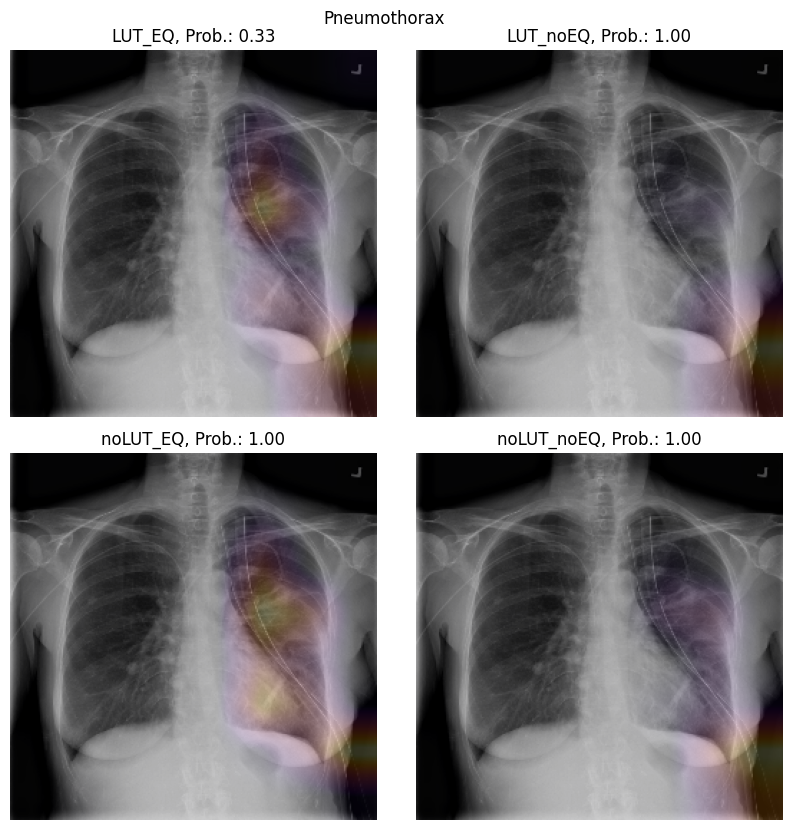

In [10]:
visualize_CAM(pathology,'~/Data/Frank/SIIM_ACR_Pneumothorax','SIIM')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4719.1517875184.295707/1.2.276.0.7230010.3.1.3.8323329.4719.1517875184.295706/1.2.276.0.7230010.3.1.4.8323329.4719.1517875184.295708.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4719.1517875184.295707/1.2.276.0.7230010.3.1.3.8323329.4719.1517875184.295706/1.2.276.0.7230010.3.1.4.8323329.4719.1517875184.295708.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4719.1517875184.295707/1.2.276.0.7230010.3.1.3.8323329.4719.1517875184.295706/1.2.276.0.7230010.3.1.4.8323329.4719.1517875184.295708.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4719.1517875184.295707/1.2.276.0.7230010.3.1.3.8323329.4719.1517875184.295706/1.2.276.0.7230010.3.1.4.8323329.4719.1517875184.295708.dcm


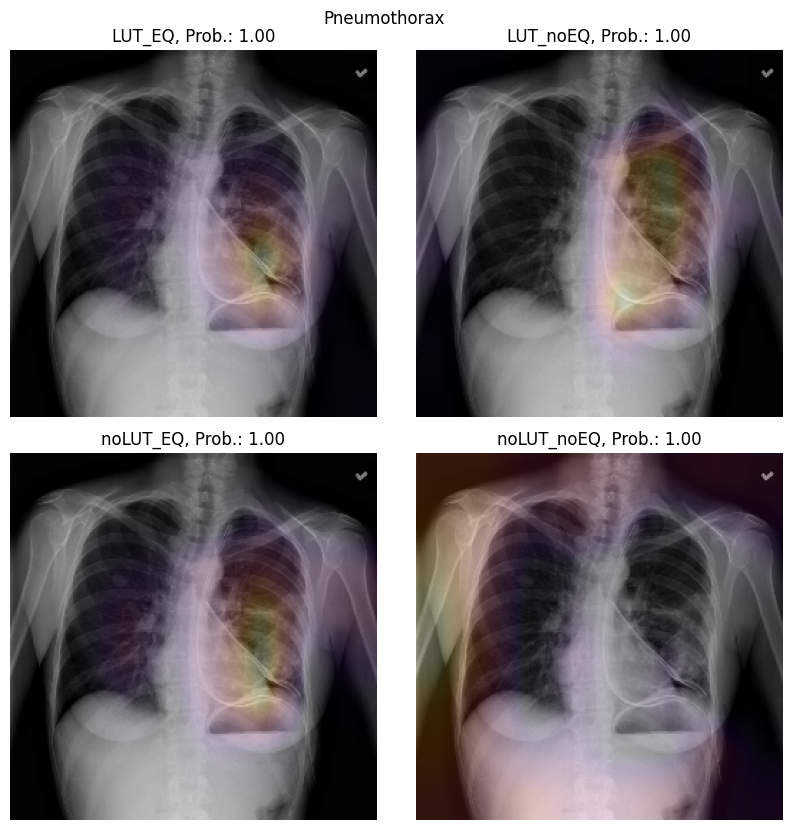

In [11]:
visualize_CAM(pathology,'~/Data/Frank/SIIM_ACR_Pneumothorax','SIIM')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.32328.1517875160.60456/1.2.276.0.7230010.3.1.3.8323329.32328.1517875160.60455/1.2.276.0.7230010.3.1.4.8323329.32328.1517875160.60457.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.32328.1517875160.60456/1.2.276.0.7230010.3.1.3.8323329.32328.1517875160.60455/1.2.276.0.7230010.3.1.4.8323329.32328.1517875160.60457.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.32328.1517875160.60456/1.2.276.0.7230010.3.1.3.8323329.32328.1517875160.60455/1.2.276.0.7230010.3.1.4.8323329.32328.1517875160.60457.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.32328.1517875160.60456/1.2.276.0.7230010.3.1.3.8323329.32328.1517875160.60455/1.2.276.0.7230010.3.1.4.8323329.32328.1517875160.60457.dcm


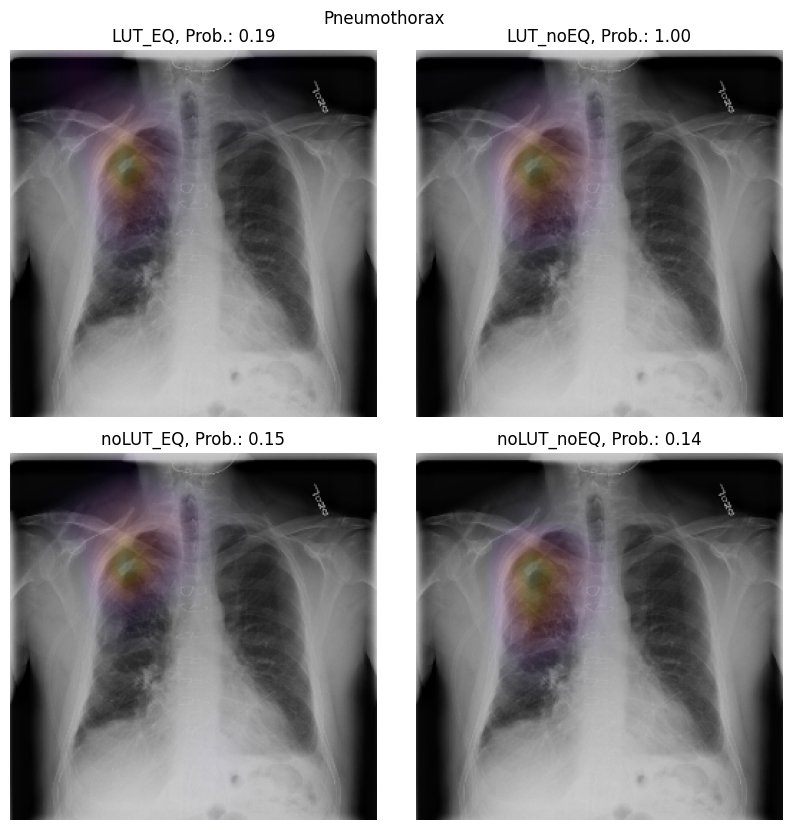

In [12]:
visualize_CAM(pathology,'~/Data/Frank/SIIM_ACR_Pneumothorax','SIIM')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4981.1517875185.834230/1.2.276.0.7230010.3.1.3.8323329.4981.1517875185.834229/1.2.276.0.7230010.3.1.4.8323329.4981.1517875185.834231.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4981.1517875185.834230/1.2.276.0.7230010.3.1.3.8323329.4981.1517875185.834229/1.2.276.0.7230010.3.1.4.8323329.4981.1517875185.834231.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4981.1517875185.834230/1.2.276.0.7230010.3.1.3.8323329.4981.1517875185.834229/1.2.276.0.7230010.3.1.4.8323329.4981.1517875185.834231.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4981.1517875185.834230/1.2.276.0.7230010.3.1.3.8323329.4981.1517875185.834229/1.2.276.0.7230010.3.1.4.8323329.4981.1517875185.834231.dcm


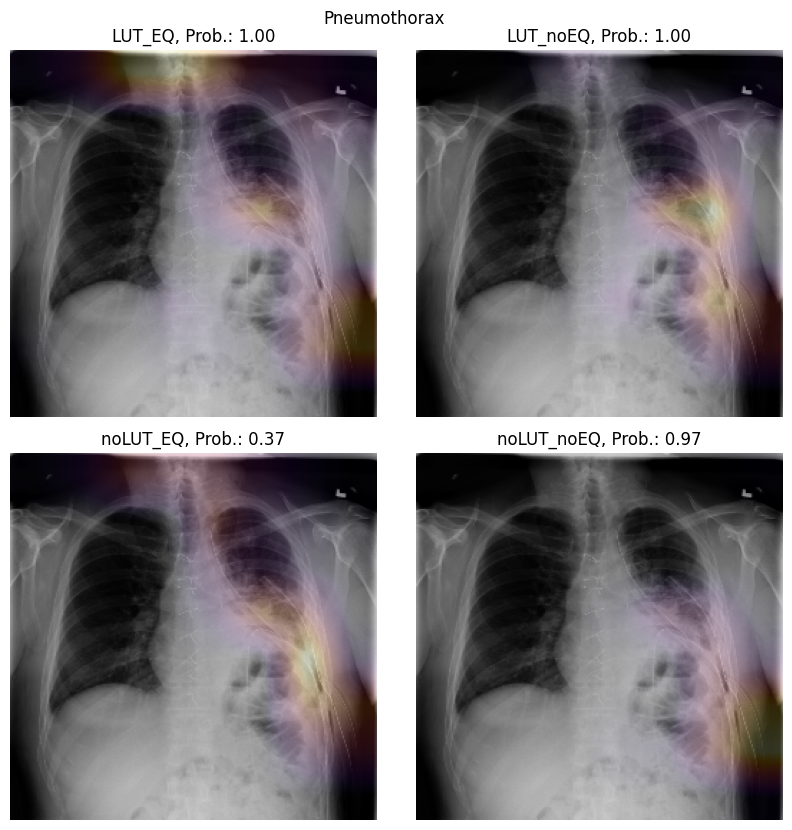

In [13]:
visualize_CAM(pathology,'~/Data/Frank/SIIM_ACR_Pneumothorax','SIIM')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.31862.1517875157.198403/1.2.276.0.7230010.3.1.3.8323329.31862.1517875157.198402/1.2.276.0.7230010.3.1.4.8323329.31862.1517875157.198404.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.31862.1517875157.198403/1.2.276.0.7230010.3.1.3.8323329.31862.1517875157.198402/1.2.276.0.7230010.3.1.4.8323329.31862.1517875157.198404.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.31862.1517875157.198403/1.2.276.0.7230010.3.1.3.8323329.31862.1517875157.198402/1.2.276.0.7230010.3.1.4.8323329.31862.1517875157.198404.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.31862.1517875157.198403/1.2.276.0.7230010.3.1.3.8323329.31862.1517875157.198402/1.2.276.0.7230010.3.1.4.8323329.31862.1517875157.198404.dcm


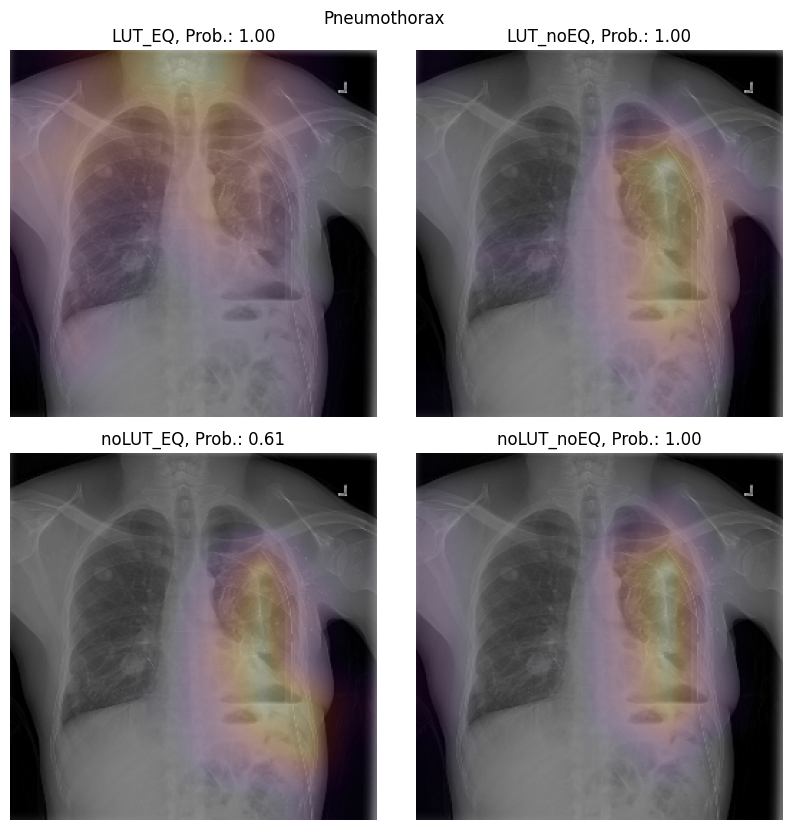

In [14]:
visualize_CAM(pathology,'~/Data/Frank/SIIM_ACR_Pneumothorax','SIIM')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4875.1517875185.211010/1.2.276.0.7230010.3.1.3.8323329.4875.1517875185.211009/1.2.276.0.7230010.3.1.4.8323329.4875.1517875185.211011.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4875.1517875185.211010/1.2.276.0.7230010.3.1.3.8323329.4875.1517875185.211009/1.2.276.0.7230010.3.1.4.8323329.4875.1517875185.211011.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4875.1517875185.211010/1.2.276.0.7230010.3.1.3.8323329.4875.1517875185.211009/1.2.276.0.7230010.3.1.4.8323329.4875.1517875185.211011.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4875.1517875185.211010/1.2.276.0.7230010.3.1.3.8323329.4875.1517875185.211009/1.2.276.0.7230010.3.1.4.8323329.4875.1517875185.211011.dcm


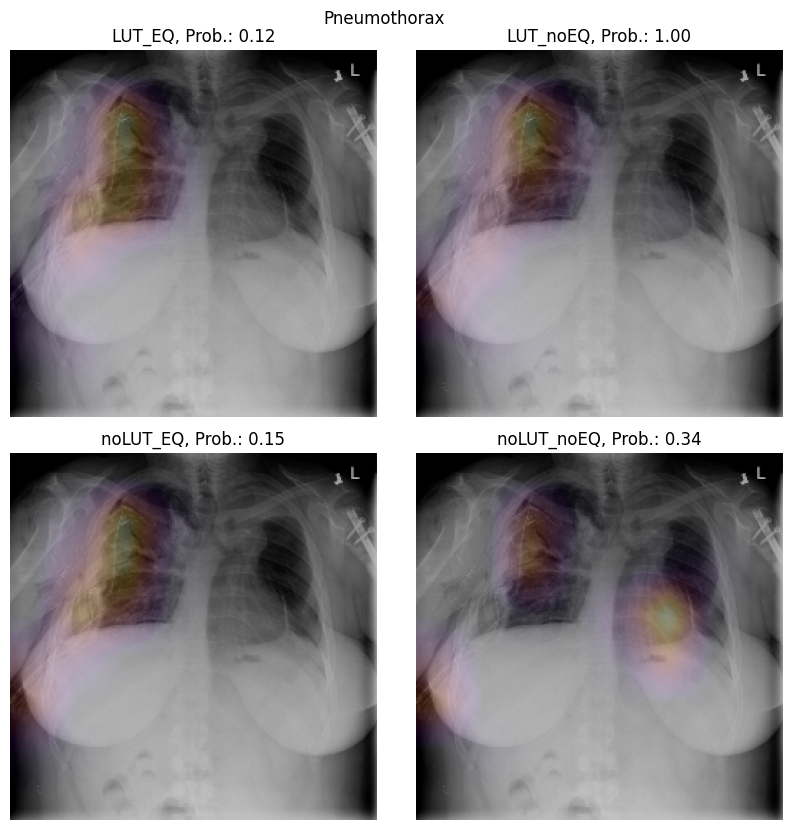

In [15]:
visualize_CAM(pathology,'~/Data/Frank/SIIM_ACR_Pneumothorax','SIIM')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4320.1517875182.271395/1.2.276.0.7230010.3.1.3.8323329.4320.1517875182.271394/1.2.276.0.7230010.3.1.4.8323329.4320.1517875182.271396.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4320.1517875182.271395/1.2.276.0.7230010.3.1.3.8323329.4320.1517875182.271394/1.2.276.0.7230010.3.1.4.8323329.4320.1517875182.271396.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4320.1517875182.271395/1.2.276.0.7230010.3.1.3.8323329.4320.1517875182.271394/1.2.276.0.7230010.3.1.4.8323329.4320.1517875182.271396.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.4320.1517875182.271395/1.2.276.0.7230010.3.1.3.8323329.4320.1517875182.271394/1.2.276.0.7230010.3.1.4.8323329.4320.1517875182.271396.dcm


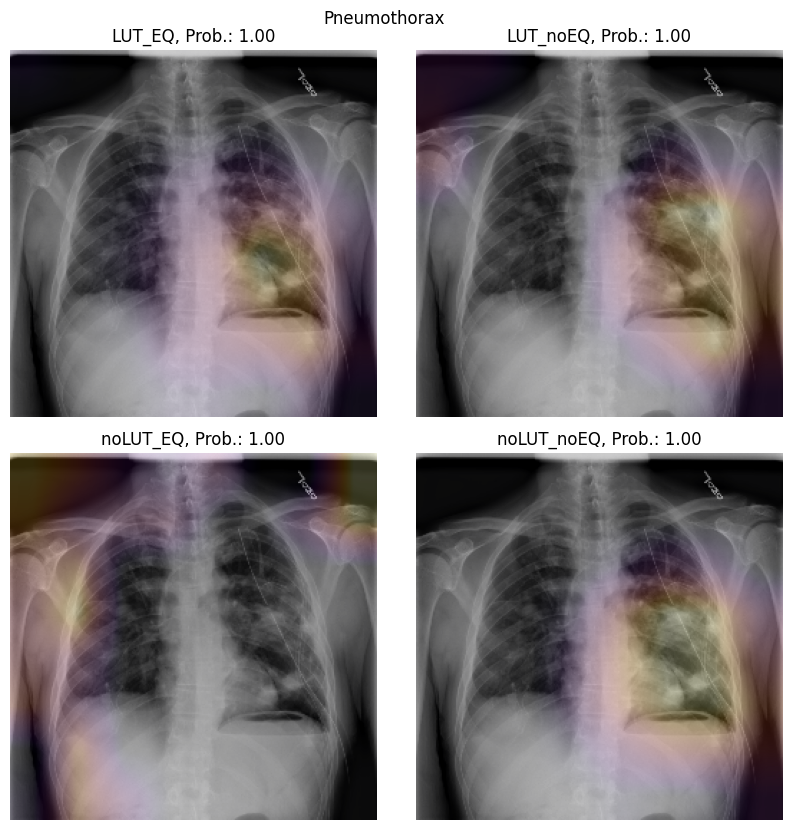

In [16]:
visualize_CAM(pathology,'~/Data/Frank/SIIM_ACR_Pneumothorax','SIIM')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.13780.1517875247.897180/1.2.276.0.7230010.3.1.3.8323329.13780.1517875247.897179/1.2.276.0.7230010.3.1.4.8323329.13780.1517875247.897181.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.13780.1517875247.897180/1.2.276.0.7230010.3.1.3.8323329.13780.1517875247.897179/1.2.276.0.7230010.3.1.4.8323329.13780.1517875247.897181.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.13780.1517875247.897180/1.2.276.0.7230010.3.1.3.8323329.13780.1517875247.897179/1.2.276.0.7230010.3.1.4.8323329.13780.1517875247.897181.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.13780.1517875247.897180/1.2.276.0.7230010.3.1.3.8323329.13780.1517875247.897179/1.2.276.0.7230010.3.1.4.8323329.13780.1517875247.897181.dcm


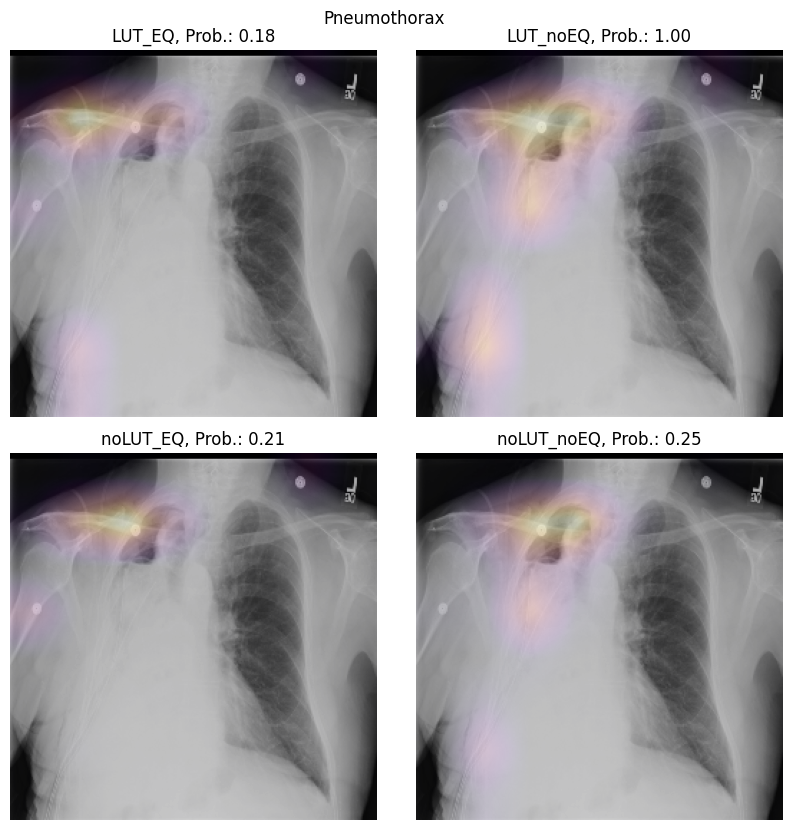

In [17]:
visualize_CAM(pathology,'~/Data/Frank/SIIM_ACR_Pneumothorax','SIIM')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.12605.1517875240.120411/1.2.276.0.7230010.3.1.3.8323329.12605.1517875240.120410/1.2.276.0.7230010.3.1.4.8323329.12605.1517875240.120412.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.12605.1517875240.120411/1.2.276.0.7230010.3.1.3.8323329.12605.1517875240.120410/1.2.276.0.7230010.3.1.4.8323329.12605.1517875240.120412.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.12605.1517875240.120411/1.2.276.0.7230010.3.1.3.8323329.12605.1517875240.120410/1.2.276.0.7230010.3.1.4.8323329.12605.1517875240.120412.dcm
/dicom-images-train/1.2.276.0.7230010.3.1.2.8323329.12605.1517875240.120411/1.2.276.0.7230010.3.1.3.8323329.12605.1517875240.120410/1.2.276.0.7230010.3.1.4.8323329.12605.1517875240.120412.dcm


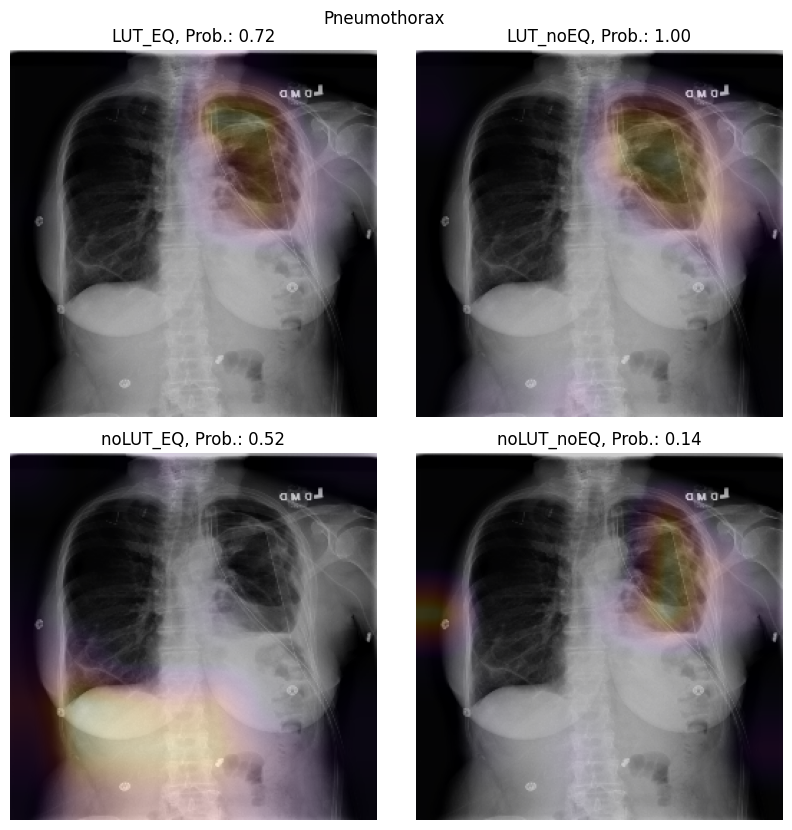

In [18]:
visualize_CAM(pathology,'~/Data/Frank/SIIM_ACR_Pneumothorax','SIIM')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient06664/study2/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient06664/study2/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient06664/study2/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient06664/study2/view1_frontal.jpg


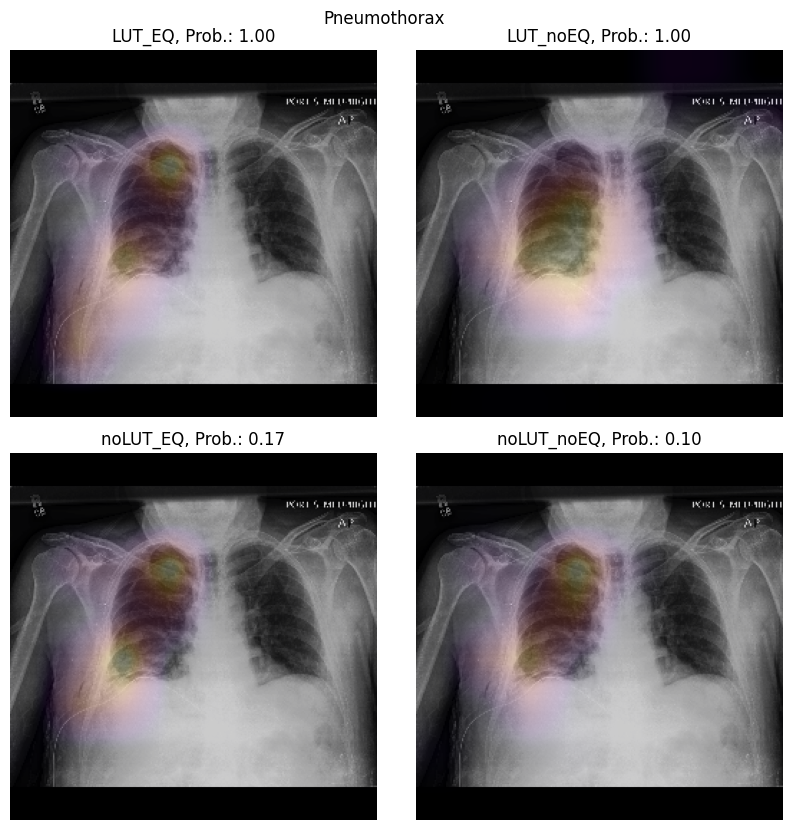

In [19]:
visualize_CAM(pathology,'','CXP')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient09217/study15/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient09217/study15/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient09217/study15/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient09217/study15/view1_frontal.jpg


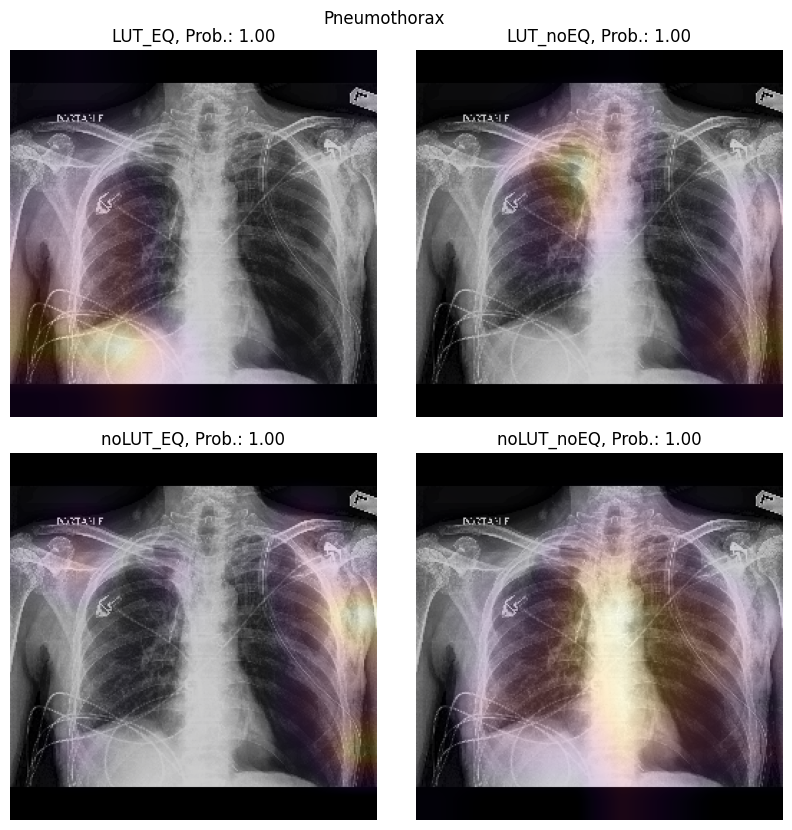

In [20]:
visualize_CAM(pathology,'','CXP')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient43804/study7/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient43804/study7/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient43804/study7/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient43804/study7/view1_frontal.jpg


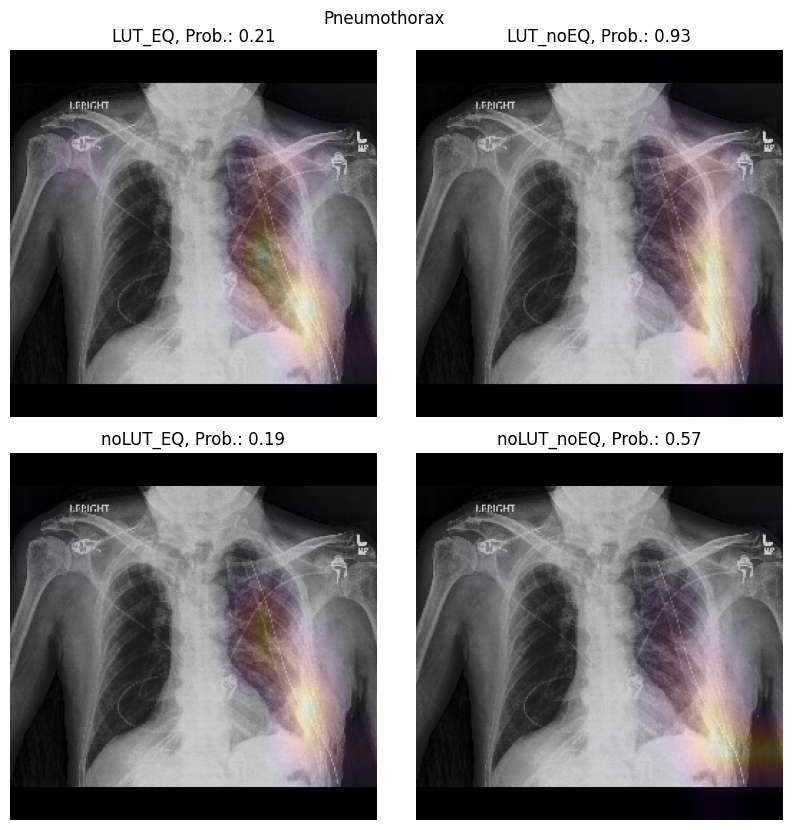

In [21]:
visualize_CAM(pathology,'','CXP')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient09217/study8/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient09217/study8/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient09217/study8/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient09217/study8/view1_frontal.jpg


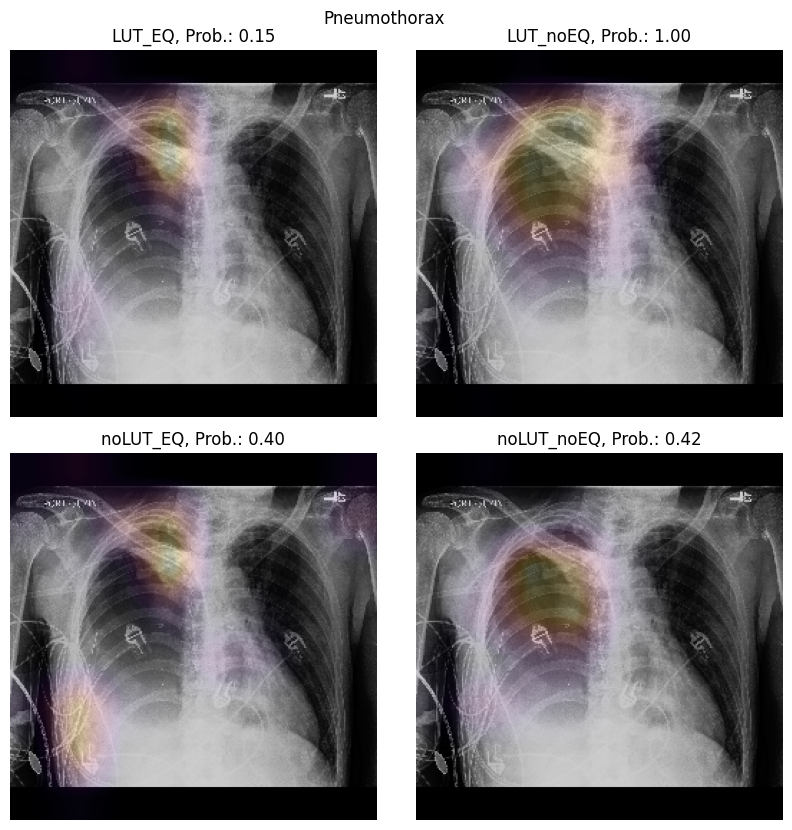

In [22]:
visualize_CAM(pathology,'','CXP')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient11828/study4/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient11828/study4/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient11828/study4/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient11828/study4/view1_frontal.jpg


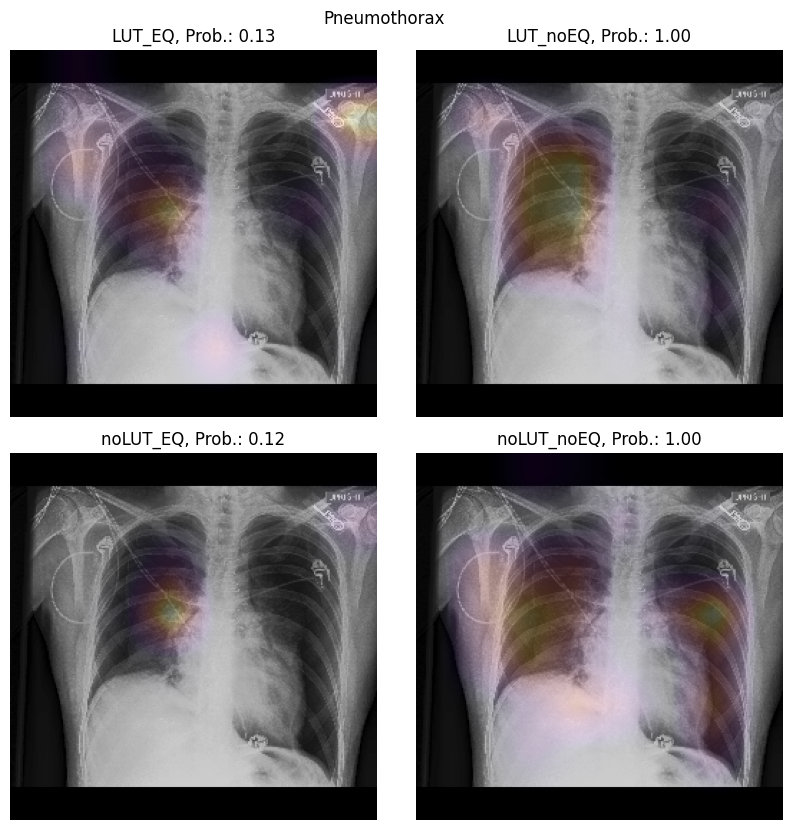

In [23]:
visualize_CAM(pathology,'','CXP')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient03665/study8/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient03665/study8/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient03665/study8/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient03665/study8/view1_frontal.jpg


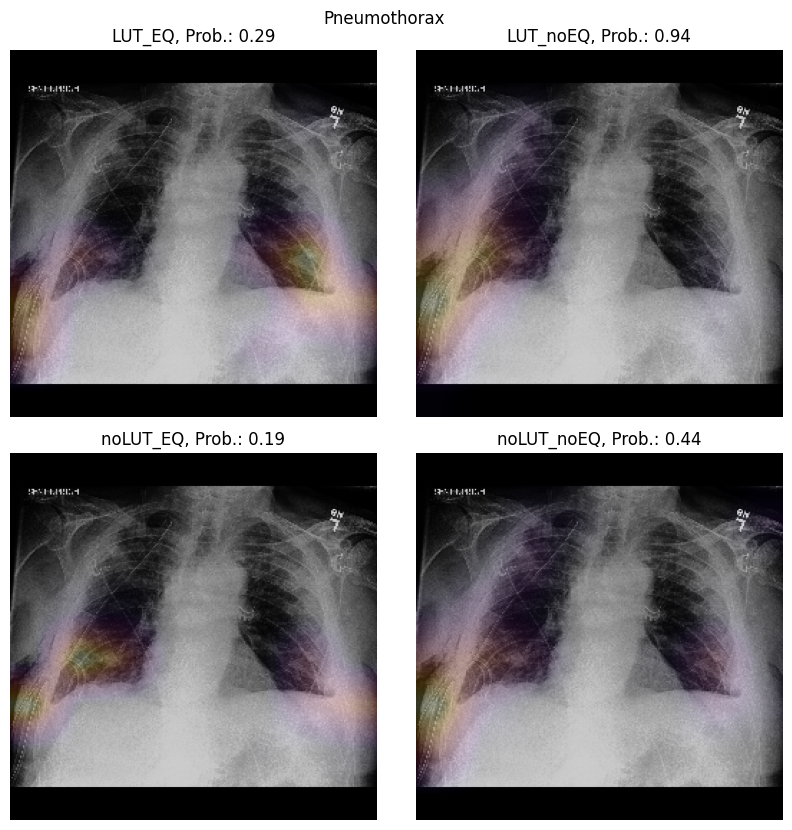

In [24]:
visualize_CAM(pathology,'','CXP')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient11828/study4/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient11828/study4/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient11828/study4/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient11828/study4/view1_frontal.jpg


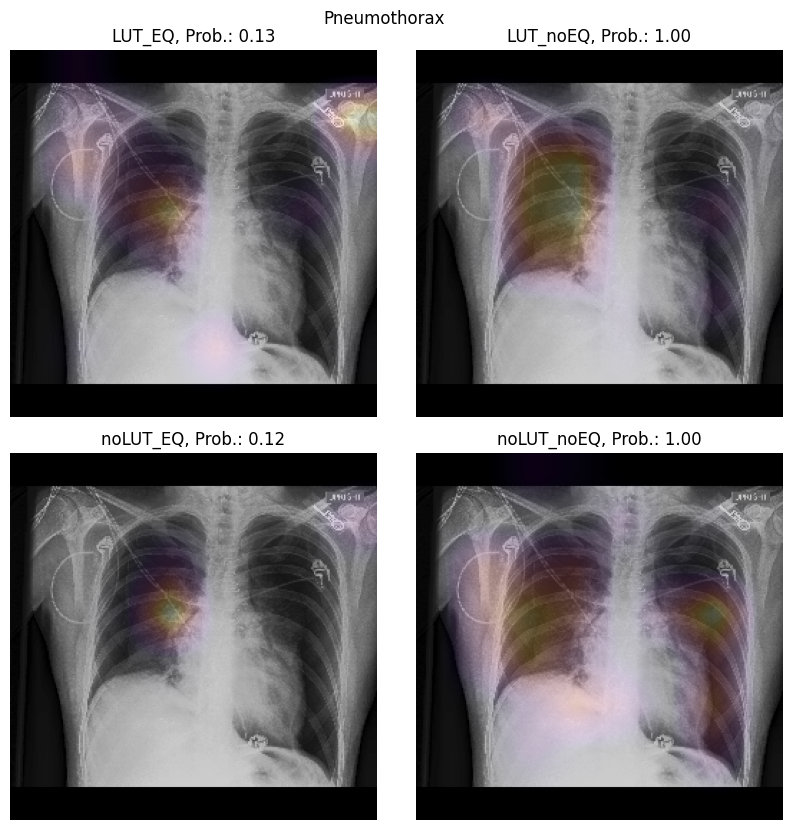

In [25]:
visualize_CAM(pathology,'','CXP')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient16006/study22/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient16006/study22/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient16006/study22/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient16006/study22/view1_frontal.jpg


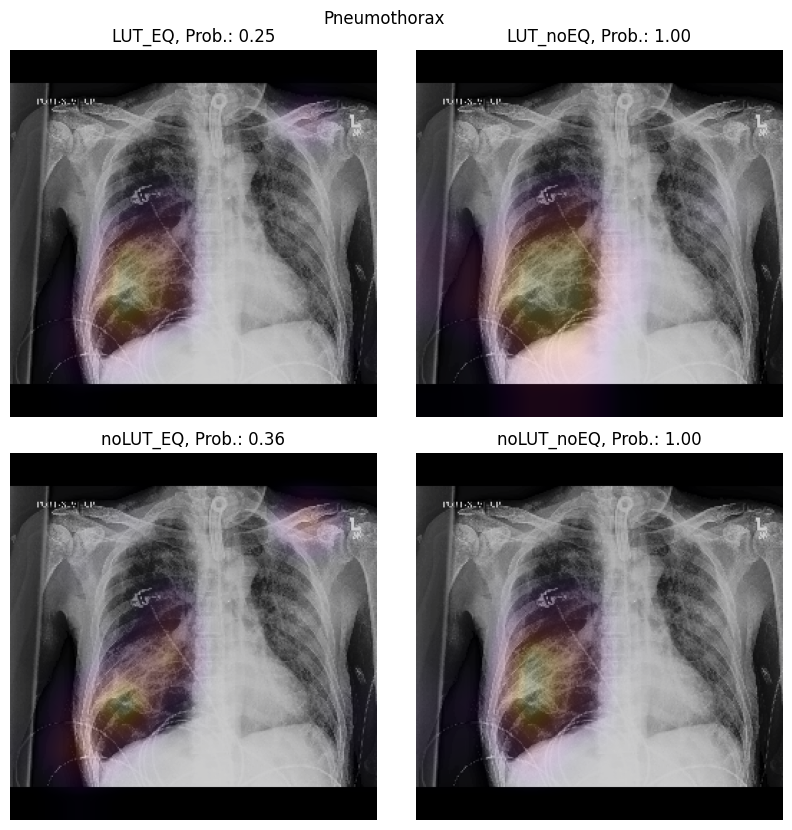

In [26]:
visualize_CAM(pathology,'','CXP')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient13288/study3/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient13288/study3/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient13288/study3/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient13288/study3/view1_frontal.jpg


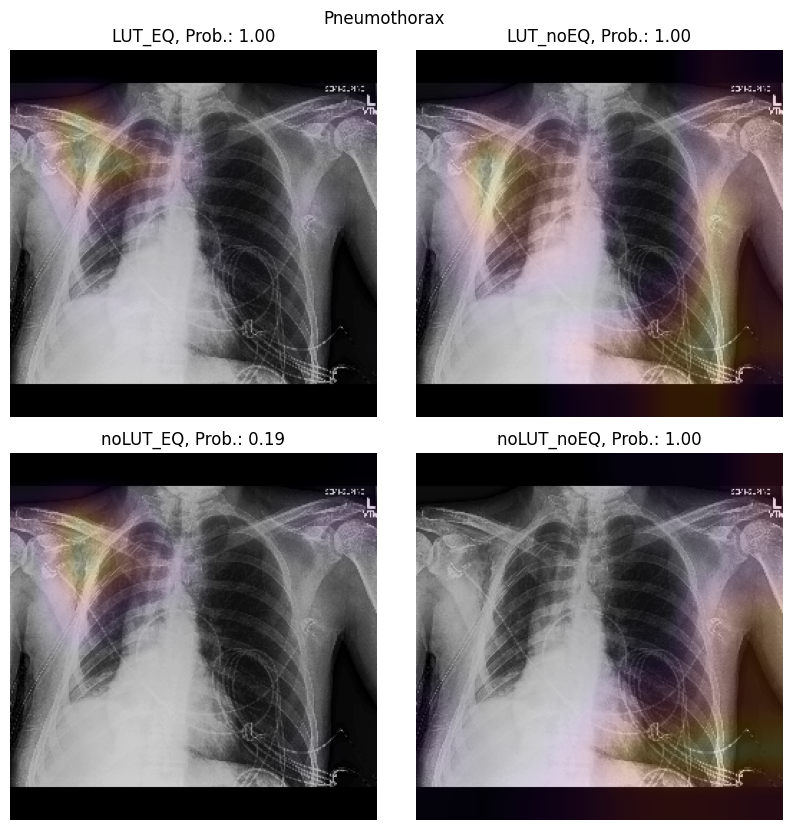

In [27]:
visualize_CAM(pathology,'','CXP')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient10900/study20/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient10900/study20/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient10900/study20/view1_frontal.jpg
/opt/localdata/Data/CXR/CheXpert-v1.0/train/patient10900/study20/view1_frontal.jpg


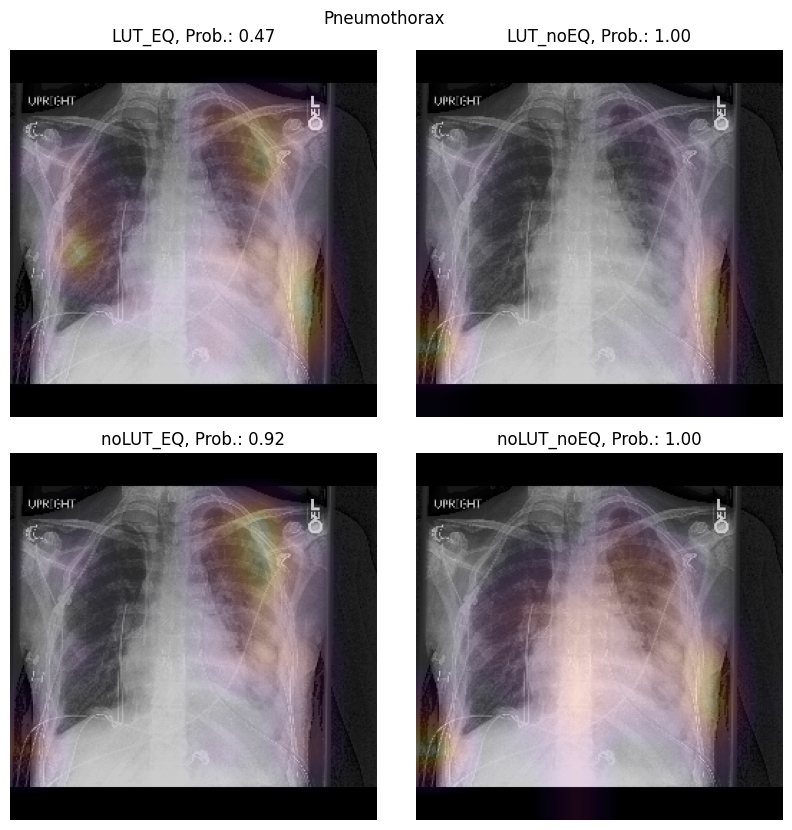

In [28]:
visualize_CAM(pathology,'','CXP')